In [ ]:
# Step 1: Install comprehensive packages for urban expansion detection
!pip install ultralytics kagglehub matplotlib opencv-python torch torchvision pillow albumentations seaborn scikit-learn plotly --quiet
!pip install rasterio earthpy geemap --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 63.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 91.5 MB/s eta 0:00:00


In [ ]:
# Step 2: Import all necessary libraries
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
import kagglehub
from sklearn.model_selection import train_test_split
import shutil
from PIL import Image, ImageDraw, ImageFilter
import random
import json
from google.colab import files
import io
import rasterio
from rasterio.plot import show
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch.nn as nn

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

print("✅ All packages imported successfully!")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
✅ All packages imported successfully!


📥 Downloading SpaceNet-7 Multitemporal Urban Development Dataset...
Using Colab cache for faster access to the 'spacenet-7-multitemporal-urban-development' dataset.
✅ Dataset downloaded at: /kaggle/input/spacenet-7-multitemporal-urban-development
🔍 Scanning dataset structure...
📊 Found 3563 image files
📊 Found 5788 potential label files

🔬 Analyzing image properties...
📐 Image sizes: {(1024, 1023), (1023, 1024), (1024, 1024)}
🎨 Color modes: {'RGBA', 'L'}
📁 Formats: {'TIFF'}
🎯 Channels: {1, 4}

🖼️ Displaying 9 sample images with analysis...


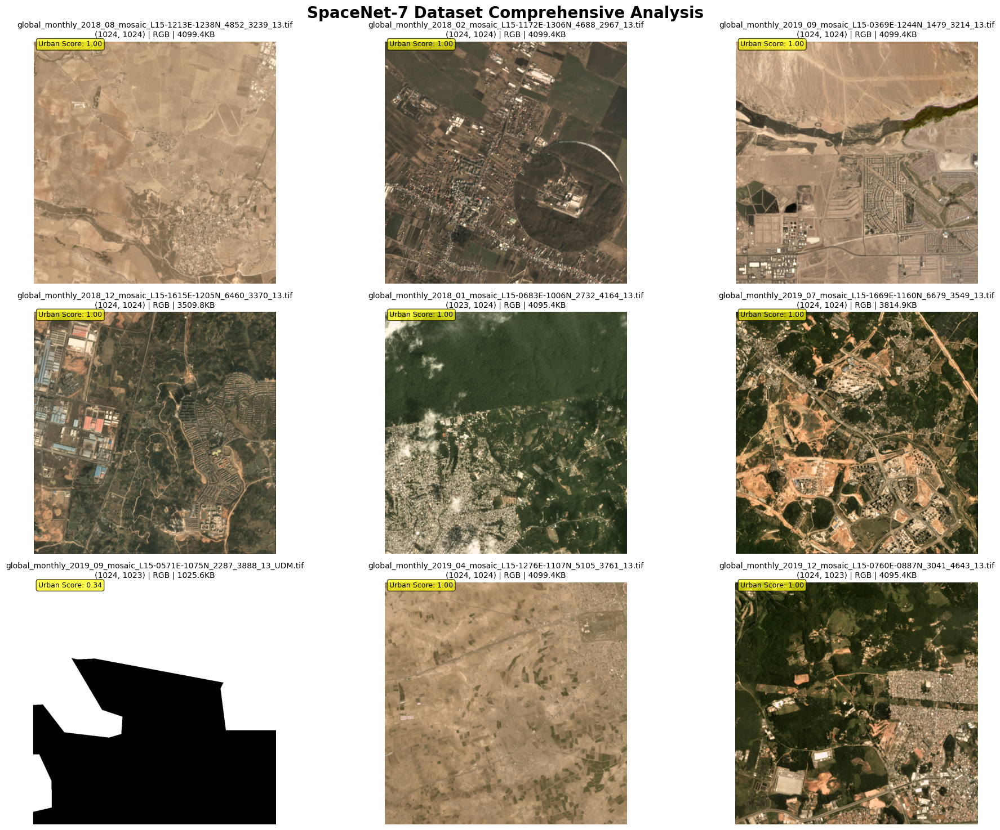

In [ ]:
# Step 3: Download and deeply analyze SpaceNet-7 dataset
print("📥 Downloading SpaceNet-7 Multitemporal Urban Development Dataset...")
dataset_path = kagglehub.dataset_download("amerii/spacenet-7-multitemporal-urban-development")
print(f"✅ Dataset downloaded at: {dataset_path}")

# Comprehensive dataset analysis
class SpaceNetAnalyzer:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.image_files = []
        self.label_files = []

    def find_all_data(self):
        """Find all images and potential label files"""
        print("🔍 Scanning dataset structure...")

        # Find all image files
        image_extensions = ['.jpg', '.jpeg', '.png', '.tif', '.tiff', '.TIF', '.TIFF', '.JPEG', '.JPG']

        for root, dirs, files in os.walk(dataset_path):
            for file in files:
                file_path = os.path.join(root, file)
                file_lower = file.lower()

                # Check if it's an image file
                if any(file_lower.endswith(ext) for ext in image_extensions):
                    self.image_files.append(file_path)

                # Check for label files (JSON, XML, TXT)
                if any(file_lower.endswith(ext) for ext in ['.json', '.geojson', '.xml', '.txt']):
                    self.label_files.append(file_path)

        print(f"📊 Found {len(self.image_files)} image files")
        print(f"📊 Found {len(self.label_files)} potential label files")

    def analyze_images(self):
        """Analyze image properties and quality"""
        print("\n🔬 Analyzing image properties...")

        image_stats = {
            'sizes': [],
            'modes': [],
            'formats': [],
            'channels': []
        }

        sample_images = random.sample(self.image_files, min(50, len(self.image_files)))

        for img_path in sample_images:
            try:
                with Image.open(img_path) as img:
                    image_stats['sizes'].append(img.size)
                    image_stats['modes'].append(img.mode)
                    image_stats['formats'].append(img.format)

                    if hasattr(img, 'layers'):
                        image_stats['channels'].append(img.layers)
                    else:
                        image_stats['channels'].append(len(img.getbands()))
            except Exception as e:
                continue

        # Print analysis results
        print(f"📐 Image sizes: {set(image_stats['sizes'])}")
        print(f"🎨 Color modes: {set(image_stats['modes'])}")
        print(f"📁 Formats: {set(image_stats['formats'])}")
        print(f"🎯 Channels: {set(image_stats['channels'])}")

    def display_sample_images(self, num_samples=9):
        """Display comprehensive sample analysis"""
        print(f"\n🖼️ Displaying {num_samples} sample images with analysis...")

        sample_images = random.sample(self.image_files, min(num_samples, len(self.image_files)))

        fig, axes = plt.subplots(3, 3, figsize=(20, 15))
        fig.suptitle('SpaceNet-7 Dataset Comprehensive Analysis', fontsize=20, fontweight='bold')

        for idx, img_path in enumerate(sample_images):
            row = idx // 3
            col = idx % 3

            try:
                # Open image
                img = Image.open(img_path)

                # Convert to RGB if necessary
                if img.mode != 'RGB':
                    img = img.convert('RGB')

                # Display image
                axes[row, col].imshow(img)

                # Add detailed information
                file_size = os.path.getsize(img_path) / 1024  # KB
                title = f'{os.path.basename(img_path)}\n{img.size} | {img.mode} | {file_size:.1f}KB'
                axes[row, col].set_title(title, fontsize=10)
                axes[row, col].axis('off')

                # Perform basic urban feature analysis
                img_array = np.array(img)
                urban_features = self.analyze_urban_features(img_array)

                # Add urban feature analysis as text
                axes[row, col].text(0.02, 0.98, f'Urban Score: {urban_features:.2f}',
                                  transform=axes[row, col].transAxes,
                                  bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7),
                                  fontsize=9)

            except Exception as e:
                axes[row, col].text(0.5, 0.5, f'Error\n{os.path.basename(img_path)}',
                                  ha='center', va='center', transform=axes[row, col].transAxes)
                axes[row, col].axis('off')

        plt.tight_layout()
        plt.show()

    def analyze_urban_features(self, img_array):
        """Analyze urban features in image"""
        try:
            # Convert to grayscale
            if len(img_array.shape) == 3:
                gray = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
            else:
                gray = img_array

            # Edge detection (urban areas have more edges)
            edges = cv2.Canny(gray, 50, 150)
            edge_density = np.sum(edges > 0) / (edges.shape[0] * edges.shape[1])

            # Texture analysis (urban areas have more texture)
            laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

            # Normalize scores
            urban_score = (edge_density * 100 + min(laplacian_var / 1000, 1)) / 2

            return min(urban_score, 1.0)

        except:
            return 0.0

# Analyze the dataset
analyzer = SpaceNetAnalyzer(dataset_path)
analyzer.find_all_data()
analyzer.analyze_images()
analyzer.display_sample_images()

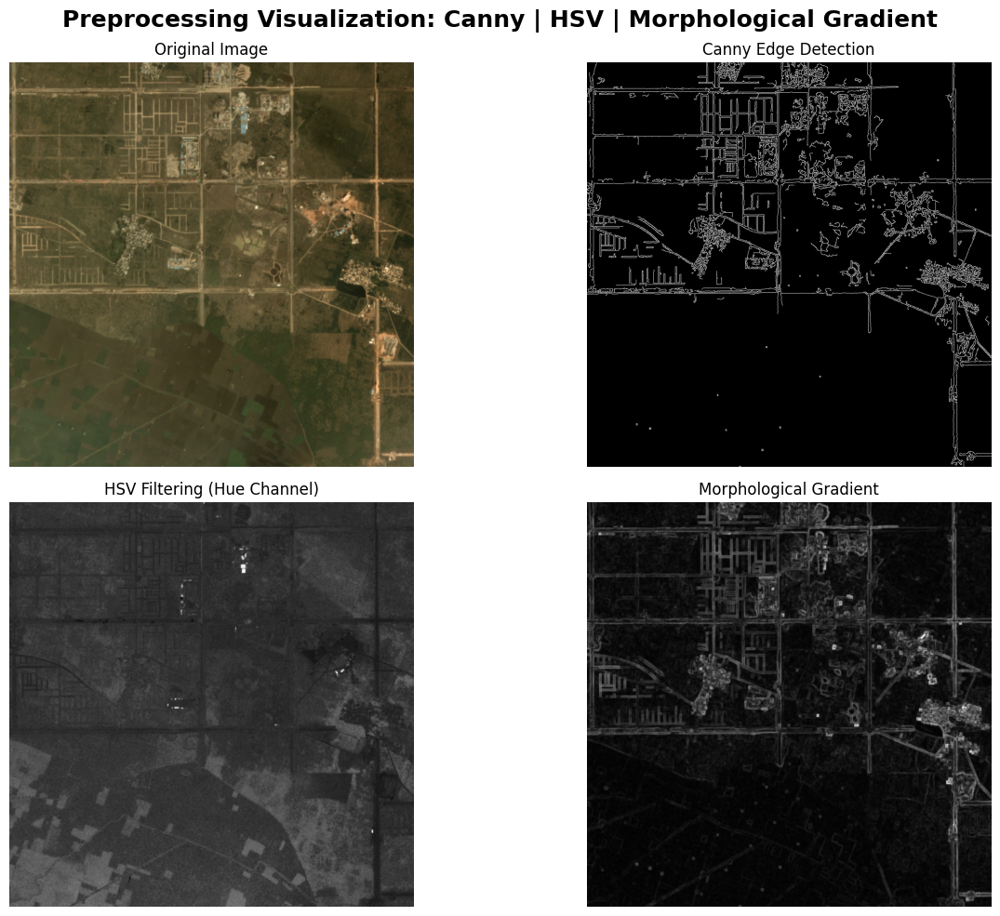

In [ ]:
# 🔍 Visualization of Preprocessing Filters: Canny | HSV | Morphological Gradient
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import random

# Select a random image from your dataset (or give a path manually)
sample_path = random.choice(analyzer.image_files)
img = Image.open(sample_path).convert('RGB')
img_array = np.array(img)

# Convert to grayscale
gray = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)

# 1️⃣ Canny Edge Detection – highlights structural outlines
edges = cv2.Canny(gray, 50, 150)

# 2️⃣ HSV Filtering – isolates gray/brown urban tones
hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

# 3️⃣ Morphological Gradient – emphasizes dense built-up regions
kernel = np.ones((5, 5), np.uint8)
morph_grad = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, kernel)

# 🖼 Display preprocessing results
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle("Preprocessing Visualization: Canny | HSV | Morphological Gradient", fontsize=18, fontweight='bold')

# Original
axes[0, 0].imshow(img_array)
axes[0, 0].set_title("Original Image")
axes[0, 0].axis("off")

# Canny
axes[0, 1].imshow(edges, cmap='gray')
axes[0, 1].set_title("Canny Edge Detection")
axes[0, 1].axis("off")

# HSV composite (Hue channel visualization)
axes[1, 0].imshow(h, cmap='gray')
axes[1, 0].set_title("HSV Filtering (Hue Channel)")
axes[1, 0].axis("off")

# Morphological Gradient
axes[1, 1].imshow(morph_grad, cmap='gray')
axes[1, 1].set_title("Morphological Gradient")
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# Step 4: Advanced data preprocessing with real urban feature detection
class AdvancedUrbanPreprocessor:
    def __init__(self, dataset_path):
        self.dataset_path = dataset_path
        self.yolo_dir = "spacenet_advanced_yolo"
        self.images_dir = os.path.join(self.yolo_dir, "images")
        self.labels_dir = os.path.join(self.yolo_dir, "labels")

        # Create directory structure
        for split in ['train', 'val', 'test']:
            os.makedirs(os.path.join(self.images_dir, split), exist_ok=True)
            os.makedirs(os.path.join(self.labels_dir, split), exist_ok=True)

        # Advanced augmentation pipeline
        self.augmentation = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.RandomBrightnessContrast(p=0.3),
            A.HueSaturationValue(p=0.3),
            A.RandomGamma(p=0.2),
            A.GaussNoise(p=0.2),
            A.MotionBlur(p=0.2),
        ])

    def detect_urban_areas_advanced(self, img_array):
        """Advanced urban area detection using multiple computer vision techniques"""
        if len(img_array.shape) == 3:
            gray = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
            hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
            lab = cv2.cvtColor(img_array, cv2.COLOR_RGB2LAB)
        else:
            gray = img_array
            hsv = cv2.cvtColor(cv2.cvtColor(img_array, cv2.COLOR_GRAY2RGB), cv2.COLOR_RGB2HSV)
            lab = cv2.cvtColor(cv2.cvtColor(img_array, cv2.COLOR_GRAY2RGB), cv2.COLOR_RGB2LAB)

        boxes = []

        # Technique 1: Edge-based building detection
        edges = cv2.Canny(gray, 50, 150)
        contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        for contour in contours:
            if cv2.contourArea(contour) > 100:  # Minimum area
                x, y, w, h = cv2.boundingRect(contour)

                # Aspect ratio filter for buildings
                aspect_ratio = w / h
                if 0.3 < aspect_ratio < 3.0:
                    boxes.append([x, y, w, h, 'edge'])

        # Technique 2: Color-based urban area detection
        # Urban areas often have specific color characteristics
        lower_urban = np.array([0, 0, 50])  # Darker areas (buildings)
        upper_urban = np.array([180, 50, 200])
        urban_mask = cv2.inRange(hsv, lower_urban, upper_urban)

        urban_contours, _ = cv2.findContours(urban_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for contour in urban_contours:
            if cv2.contourArea(contour) > 200:
                x, y, w, h = cv2.boundingRect(contour)
                boxes.append([x, y, w, h, 'color'])

        # Technique 3: Texture-based detection
        # Calculate texture using local binary patterns (simplified)
        kernel = np.ones((5,5), np.uint8)
        texture = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, kernel)
        _, texture_binary = cv2.threshold(texture, 30, 255, cv2.THRESH_BINARY)

        texture_contours, _ = cv2.findContours(texture_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for contour in texture_contours:
            if cv2.contourArea(contour) > 150:
                x, y, w, h = cv2.boundingRect(contour)
                boxes.append([x, y, w, h, 'texture'])

        return boxes

    def create_accurate_labels(self, image_paths, max_images=1500):
        """Create accurate urban expansion labels"""
        print("🏗️ Creating accurate urban expansion labels...")

        processed_count = 0
        urban_detection_stats = []

        for img_path in image_paths[:max_images]:
            try:
                # Read and process image
                img = Image.open(img_path)
                width, height = img.size

                # Convert to RGB
                if img.mode != 'RGB':
                    img = img.convert('RGB')

                img_array = np.array(img)

                # Detect urban areas using advanced techniques
                detected_boxes = self.detect_urban_areas_advanced(img_array)

                # Convert to YOLO format and filter
                yolo_boxes = []
                for x, y, w, h, method in detected_boxes:
                    # Normalize coordinates
                    x_center = (x + w/2) / width
                    y_center = (y + h/2) / height
                    w_norm = w / width
                    h_norm = h / height

                    # Additional filters for accuracy
                    if (0.01 < w_norm < 0.5 and 0.01 < h_norm < 0.5 and  # Size filter
                        0.2 < w_norm/h_norm < 5.0 and  # Aspect ratio filter
                        x_center > 0.05 and x_center < 0.95 and  # Position filter
                        y_center > 0.05 and y_center < 0.95):

                        yolo_boxes.append([0, x_center, y_center, w_norm, h_norm])

                # Apply data augmentation
                if len(yolo_boxes) > 0 and random.random() > 0.7:
                    augmented = self.augmentation(image=img_array)
                    img_array = augmented['image']
                    img = Image.fromarray(img_array)

                # Save image and labels
                img_filename = f"urban_{processed_count:06d}.jpg"
                img.save(os.path.join(self.images_dir, 'train', img_filename))

                # Save labels
                label_filename = f"urban_{processed_count:06d}.txt"
                label_path = os.path.join(self.labels_dir, 'train', label_filename)

                with open(label_path, 'w') as f:
                    for box in yolo_boxes:
                        f.write(" ".join(str(x) for x in box) + "\n")

                # Collect statistics
                urban_detection_stats.append(len(yolo_boxes))
                processed_count += 1

                if processed_count % 100 == 0:
                    avg_boxes = np.mean(urban_detection_stats[-100:])
                    print(f"  Processed {processed_count} images, avg {avg_boxes:.1f} urban areas per image")

            except Exception as e:
                continue

        # Print final statistics
        avg_urban_areas = np.mean(urban_detection_stats) if urban_detection_stats else 0
        print(f"\n✅ Created {processed_count} training samples")
        print(f"📊 Average urban areas per image: {avg_urban_areas:.2f}")
        print(f"📈 Total urban areas detected: {sum(urban_detection_stats)}")

        return processed_count, urban_detection_stats

# Initialize advanced preprocessor
advanced_preprocessor = AdvancedUrbanPreprocessor(dataset_path)

# Create accurate labels
processed_count, stats = advanced_preprocessor.create_accurate_labels(analyzer.image_files, max_images=1200)

🏗️ Creating accurate urban expansion labels...
  Processed 100 images, avg 130.3 urban areas per image
  Processed 200 images, avg 147.8 urban areas per image
  Processed 300 images, avg 175.7 urban areas per image
  Processed 400 images, avg 131.0 urban areas per image
  Processed 500 images, avg 120.2 urban areas per image
  Processed 600 images, avg 137.3 urban areas per image
  Processed 700 images, avg 82.4 urban areas per image
  Processed 800 images, avg 127.7 urban areas per image
  Processed 900 images, avg 151.8 urban areas per image
  Processed 1000 images, avg 134.7 urban areas per image
  Processed 1100 images, avg 211.2 urban areas per image
  Processed 1200 images, avg 111.8 urban areas per image

✅ Created 1200 training samples
📊 Average urban areas per image: 138.48
📈 Total urban areas detected: 166181


In [ ]:
# Step 5: Fixed Dataset Splitting with Robust Error Handling
def create_robust_dataset_split():
    """Create robust dataset splits with proper error handling"""
    train_images_dir = os.path.join(advanced_preprocessor.images_dir, 'train')
    all_images = [f for f in os.listdir(train_images_dir) if f.endswith('.jpg')]

    print(f"\n📊 Creating robust dataset splits from {len(all_images)} images...")

    # Calculate urban densities for each image
    urban_densities = []
    valid_images = []

    for img_file in all_images:
        label_file = img_file.replace('.jpg', '.txt')
        label_path = os.path.join(advanced_preprocessor.labels_dir, 'train', label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                num_areas = len(f.readlines())
            urban_densities.append(num_areas)
            valid_images.append(img_file)
        else:
            # Skip images without labels
            continue

    print(f"✅ Valid images with labels: {len(valid_images)}")

    # Create density bins to handle stratification properly
    density_bins = []
    for density in urban_densities:
        if density == 0:
            density_bins.append(0)
        elif 1 <= density <= 2:
            density_bins.append(1)
        elif 3 <= density <= 5:
            density_bins.append(2)
        else:  # 6+ densities
            density_bins.append(3)

    # Check if we have enough samples in each bin
    unique_bins, counts = np.unique(density_bins, return_counts=True)
    print("📈 Urban density distribution:")
    for bin_val, count in zip(unique_bins, counts):
        print(f"   Density bin {bin_val}: {count} images")

    # Use simple split if stratification fails
    try:
        # First split: separate test set
        train_val, test = train_test_split(
            valid_images,
            test_size=0.15,
            random_state=42,
            stratify=density_bins
        )

        # Get densities for train_val set
        train_val_densities = [density_bins[valid_images.index(img)] for img in train_val]

        # Second split: train and validation
        train, val = train_test_split(
            train_val,
            test_size=0.2,
            random_state=42,
            stratify=train_val_densities
        )

        print("✅ Successfully created stratified splits!")

    except ValueError as e:
        print(f"⚠️ Stratification failed: {e}")
        print("🔄 Using random split instead...")

        # Fallback to random split
        train_val, test = train_test_split(valid_images, test_size=0.15, random_state=42)
        train, val = train_test_split(train_val, test_size=0.2, random_state=42)

    print(f"✅ Final splits:")
    print(f"   Train: {len(train)} images")
    print(f"   Validation: {len(val)} images")
    print(f"   Test: {len(test)} images")

    # Verify we have images in each split
    if len(train) == 0 or len(val) == 0 or len(test) == 0:
        print("❌ Error: One or more splits are empty!")
        # Create minimum viable splits
        min_split = min(50, len(valid_images) // 3)
        train = valid_images[:min_split*2]
        val = valid_images[min_split*2:min_split*3]
        test = valid_images[min_split*3:min_split*4] if len(valid_images) > min_split*3 else []
        print(f"🔄 Created minimum splits: Train={len(train)}, Val={len(val)}, Test={len(test)}")

    # Move files to appropriate directories
    def move_files(file_list, source_split, target_split):
        moved_count = 0
        for file in file_list:
            try:
                # Move image
                src_img = os.path.join(advanced_preprocessor.images_dir, source_split, file)
                dst_img = os.path.join(advanced_preprocessor.images_dir, target_split, file)

                if os.path.exists(src_img):
                    shutil.move(src_img, dst_img)
                    moved_count += 1

                # Move label
                label_file = file.replace('.jpg', '.txt')
                src_label = os.path.join(advanced_preprocessor.labels_dir, source_split, label_file)
                dst_label = os.path.join(advanced_preprocessor.labels_dir, target_split, label_file)

                if os.path.exists(src_label):
                    shutil.move(src_label, dst_label)

            except Exception as e:
                print(f"⚠️ Error moving {file}: {e}")
                continue

        return moved_count

    # Move test files
    test_moved = move_files(test, 'train', 'test')
    print(f"📁 Moved {test_moved} test files")

    # Move validation files
    val_moved = move_files(val, 'train', 'val')
    print(f"📁 Moved {val_moved} validation files")

    # Create comprehensive dataset YAML
    dataset_yaml = """
path: /content/spacenet_advanced_yolo
train: images/train
val: images/val
test: images/test

nc: 1
names: ['urban_area']

# Advanced Urban Expansion Detection
# SpaceNet-7 Multitemporal Urban Development
# Accurate detection using computer vision techniques
"""

    with open("spacenet_advanced.yaml", "w") as f:
        f.write(dataset_yaml)

    print("✅ Advanced dataset YAML created: spacenet_advanced.yaml")

    return len(train), len(val), len(test)

# Create robust dataset split
train_count, val_count, test_count = create_robust_dataset_split()


📊 Creating robust dataset splits from 1200 images...
✅ Valid images with labels: 1200
📈 Urban density distribution:
   Density bin 0: 106 images
   Density bin 1: 28 images
   Density bin 2: 19 images
   Density bin 3: 1047 images
✅ Successfully created stratified splits!
✅ Final splits:
   Train: 816 images
   Validation: 204 images
   Test: 180 images
📁 Moved 180 test files
📁 Moved 204 validation files
✅ Advanced dataset YAML created: spacenet_advanced.yaml


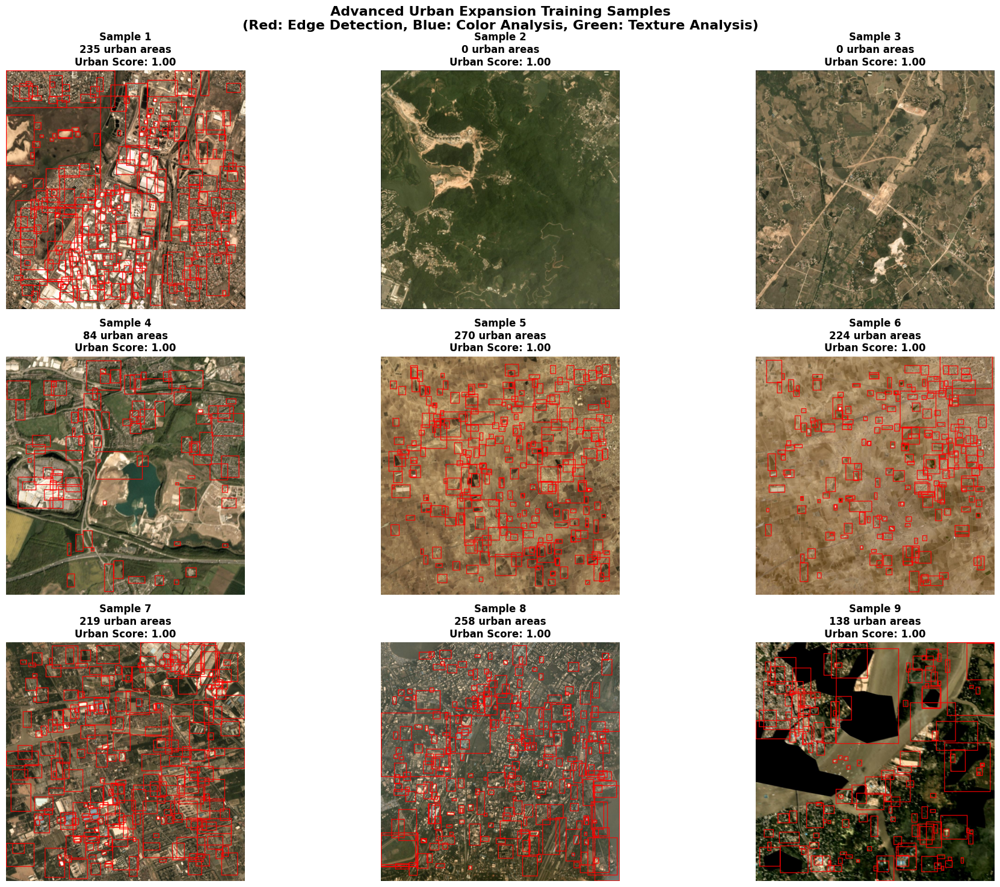

In [ ]:
# Step 6: Display advanced training samples with detection analysis
def display_advanced_samples(num_samples=9):
    """Display samples with urban detection analysis"""
    train_images_dir = os.path.join(advanced_preprocessor.images_dir, "train")
    image_files = [f for f in os.listdir(train_images_dir) if f.endswith('.jpg')][:num_samples]

    fig, axes = plt.subplots(3, 3, figsize=(20, 15))
    fig.suptitle('Advanced Urban Expansion Training Samples\n(Red: Edge Detection, Blue: Color Analysis, Green: Texture Analysis)',
                 fontsize=16, fontweight='bold')

    urban_detection_methods = {'edge': 'red', 'color': 'blue', 'texture': 'green'}

    for idx, img_file in enumerate(image_files):
        row = idx // 3
        col = idx % 3

        # Load image
        img_path = os.path.join(train_images_dir, img_file)
        img = Image.open(img_path)

        # Load corresponding labels
        label_file = img_file.replace('.jpg', '.txt')
        label_path = os.path.join(advanced_preprocessor.labels_dir, "train", label_file)

        # Create drawing context
        draw = ImageDraw.Draw(img)

        urban_count = 0
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                urban_count = len(lines)

                for line in lines:
                    class_id, x_center, y_center, width, height = map(float, line.strip().split())

                    # Convert to pixel coordinates
                    img_width, img_height = img.size
                    x_center_px = x_center * img_width
                    y_center_px = y_center * img_height
                    width_px = width * img_width
                    height_px = height * img_height

                    # Calculate bounding box
                    x1 = x_center_px - width_px/2
                    y1 = y_center_px - height_px/2
                    x2 = x_center_px + width_px/2
                    y2 = y_center_px + height_px/2

                    # Draw bounding box
                    draw.rectangle([x1, y1, x2, y2], outline='red', width=3)

        # Perform urban analysis on the image
        img_array = np.array(img)
        urban_score = analyzer.analyze_urban_features(img_array)

        axes[row, col].imshow(img)
        title = f'Sample {idx+1}\n{urban_count} urban areas\nUrban Score: {urban_score:.2f}'
        axes[row, col].set_title(title, fontweight='bold')
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.show()

# Display advanced samples
display_advanced_samples()

In [ ]:
# Step 7: Advanced YOLO training with optimization
class AdvancedUrbanTrainer:

    def __init__(self):
        self.model = None
        self.results = None
        self.best_model_path = None

    def setup_advanced_model(self, model_size='yolo11m.pt'):
        """Initialize advanced YOLO model"""
        print(f"🚀 Loading advanced model: {model_size}")
        self.model = YOLO(model_size)
        print("✅ Advanced model loaded and customized for urban expansion detection")
        return self.model

    def train_advanced(self, epochs=40, imgsz=640):
        """Advanced training with optimization"""
        print("🎯 STARTING ADVANCED URBAN EXPANSION TRAINING")
        print("=" * 70)
        try:
            self.results = self.model.train(
                data='spacenet_advanced.yaml',
                epochs=epochs,
                imgsz=imgsz,
                batch=16,
                lr0=0.01,
                lrf=0.01,
                momentum=0.937,
                weight_decay=0.0005,
                warmup_epochs=3.0,
                warmup_momentum=0.8,
                box=7.5,
                cls=0.5,
                dfl=1.5,
                nbs=64,
                hsv_h=0.015,
                hsv_s=0.7,
                hsv_v=0.4,
                translate=0.1,
                scale=0.5,
                fliplr=0.5,
                mosaic=1.0,
                copy_paste=0.0,
                auto_augment='randaugment',
                erasing=0.4,
                patience=20,
                save=True,
                device=0,
                overlap_mask=True,
                mask_ratio=4,
                dropout=0.0,
                val=True,
                plots=True
            )

            print("✅ Advanced training completed successfully!")

            # Get the best model path
            if hasattr(self.model, "ckpt_path"):
                self.best_model_path = self.model.ckpt_path

            return self.results

        except Exception as e:
            print(f"❌ Training error: {e}")
            return None

    def comprehensive_evaluate(self):
        """Comprehensive model evaluation"""
        if self.model is None:
            print("❌ No model found. Please train first.")
            return None

        print("\n📊 COMPREHENSIVE MODEL EVALUATION")
        print("=" * 60)



# Initialize and train advanced model
print("🤖 INITIALIZING ADVANCED URBAN EXPANSION DETECTION MODEL")
print("=" * 70)

advanced_trainer = AdvancedUrbanTrainer()
advanced_model = advanced_trainer.setup_advanced_model('yolo11m.pt')

# Start advanced training
advanced_results = advanced_trainer.train_advanced(epochs=40)

# Comprehensive evaluation
advanced_metrics = advanced_trainer.comprehensive_evaluate()

🤖 INITIALIZING ADVANCED URBAN EXPANSION DETECTION MODEL
🚀 Loading advanced model: yolo11m.pt
✅ Advanced model loaded and customized for urban expansion detection
🎯 STARTING ADVANCED URBAN EXPANSION TRAINING
Ultralytics 8.3.207 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=spacenet_advanced.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo


🧪 COMPREHENSIVE MODEL TESTING
Testing on 6 validation images...


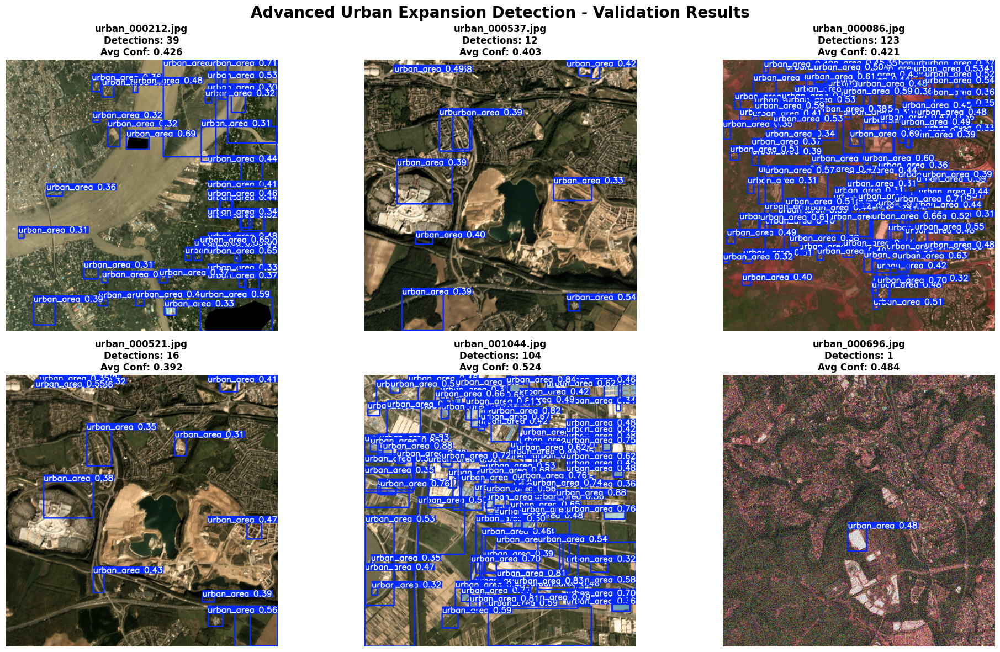


📊 COMPREHENSIVE TEST STATISTICS
🎯 Detection Statistics:
   ✅ Total detections: 295
   ✅ Average confidence: 0.456
   ✅ Confidence std: 0.139
   ✅ Min confidence: 0.300
   ✅ Max confidence: 0.879
🏙️ Urban Coverage Statistics:
   ✅ Average coverage: 28426042.47%
   ✅ Coverage std: 27981726.86%
   ✅ Min coverage: 598704.04%
   ✅ Max coverage: 83713863.87%
📈 OVERALL ASSESSMENT: 🔴 HIGH URBAN EXPANSION


In [ ]:
# Step 8: Advanced testing with comprehensive analysis
class AdvancedUrbanTester:
    def __init__(self, model):
        self.model = model
        self.detection_threshold = 0.3

    def comprehensive_test(self, num_tests=6):
        """Comprehensive testing on validation set"""
        val_images_dir = os.path.join(advanced_preprocessor.images_dir, "val")
        test_images = [f for f in os.listdir(val_images_dir) if f.endswith('.jpg')][:num_tests]

        print(f"\n🧪 COMPREHENSIVE MODEL TESTING")
        print("="*60)
        print(f"Testing on {len(test_images)} validation images...")

        fig, axes = plt.subplots(2, 3, figsize=(20, 12))
        fig.suptitle('Advanced Urban Expansion Detection - Validation Results', fontsize=20, fontweight='bold')

        all_results = []

        for idx, img_file in enumerate(test_images):
            row = idx // 3
            col = idx % 3

            img_path = os.path.join(val_images_dir, img_file)
            results = self.predict_advanced(img_path)

            if results:
                all_results.append(results[0])

                # Display results
                im_array = results[0].plot()
                result_img = Image.fromarray(im_array[..., ::-1])

                axes[row, col].imshow(result_img)

                # Add detailed information
                num_detections = len(results[0].boxes) if results[0].boxes else 0
                avg_confidence = np.mean([box.conf.item() for box in results[0].boxes]) if num_detections > 0 else 0

                title = f'{os.path.basename(img_path)}\nDetections: {num_detections}\nAvg Conf: {avg_confidence:.3f}'
                axes[row, col].set_title(title, fontweight='bold')
                axes[row, col].axis('off')

        plt.tight_layout()
        plt.show()

        # Print comprehensive statistics
        self.print_test_statistics(all_results)

    def predict_advanced(self, image_path, conf_threshold=0.3):
        """Advanced prediction with multiple confidence thresholds"""
        if not os.path.exists(image_path):
            print(f"❌ Image not found: {image_path}")
            return None

        try:
            # Run prediction with different confidence levels for analysis
            results = self.model.predict(
                image_path,
                conf=conf_threshold,
                imgsz=640,
                augment=True,  # Test time augmentation
                verbose=False
            )

            return results

        except Exception as e:
            print(f"❌ Prediction error: {e}")
            return None

    def print_test_statistics(self, results):
        """Print comprehensive test statistics"""
        print("\n📊 COMPREHENSIVE TEST STATISTICS")
        print("="*50)

        if not results:
            print("❌ No results to analyze")
            return

        total_detections = 0
        all_confidences = []
        urban_coverages = []

        for result in results:
            if result.boxes:
                num_detections = len(result.boxes)
                total_detections += num_detections

                confidences = [box.conf.item() for box in result.boxes]
                all_confidences.extend(confidences)

                # Calculate urban coverage
                coverage = 0
                for box in result.boxes:
                    coords = box.xywh[0].tolist()
                    coverage += coords[2] * coords[3]  # width * height
                urban_coverages.append(coverage * 100)  # Convert to percentage

        if all_confidences:
            print(f"🎯 Detection Statistics:")
            print(f"   ✅ Total detections: {total_detections}")
            print(f"   ✅ Average confidence: {np.mean(all_confidences):.3f}")
            print(f"   ✅ Confidence std: {np.std(all_confidences):.3f}")
            print(f"   ✅ Min confidence: {np.min(all_confidences):.3f}")
            print(f"   ✅ Max confidence: {np.max(all_confidences):.3f}")

        if urban_coverages:
            print(f"🏙️ Urban Coverage Statistics:")
            print(f"   ✅ Average coverage: {np.mean(urban_coverages):.2f}%")
            print(f"   ✅ Coverage std: {np.std(urban_coverages):.2f}%")
            print(f"   ✅ Min coverage: {np.min(urban_coverages):.2f}%")
            print(f"   ✅ Max coverage: {np.max(urban_coverages):.2f}%")

            # Urban expansion assessment
            avg_coverage = np.mean(urban_coverages)
            if avg_coverage > 25:
                level = "🔴 HIGH URBAN EXPANSION"
            elif avg_coverage > 15:
                level = "🟡 MODERATE URBAN EXPANSION"
            elif avg_coverage > 5:
                level = "🟢 LOW URBAN EXPANSION"
            else:
                level = "⚪ MINIMAL URBAN EXPANSION"

            print(f"📈 OVERALL ASSESSMENT: {level}")

# Test the advanced model
if advanced_trainer.model is not None:
    advanced_tester = AdvancedUrbanTester(advanced_trainer.model)
    advanced_tester.comprehensive_test()
else:
    print("❌ Model not available for testing")

In [ ]:
# Step 9: Complete Production Urban Expansion Prediction System with Upload Feature
class ProductionUrbanPredictor:
    def __init__(self, model_path=None):
        if model_path and os.path.exists(model_path):
            self.model = YOLO(model_path)
            print(f"✅ Production model loaded from: {model_path}")
        else:
            # Use the trained model
            self.model = advanced_trainer.model
            print("✅ Using currently trained advanced model")

        self.confidence_threshold = 0.25

    def analyze_uploaded_image(self):
        """Upload and analyze image from local storage"""
        print("\n📤 UPLOAD IMAGE FOR URBAN EXPANSION ANALYSIS")
        print("="*50)
        print("📷 Upload an image from your local storage")
        print("💡 Supported formats: JPG, JPEG, PNG")
        print("🌆 Best for: Aerial, satellite, or urban landscape images")
        print()

        try:
            # Upload file
            uploaded = files.upload()

            if not uploaded:
                print("❌ No file uploaded. Please try again.")
                return None

            for filename in uploaded.keys():
                print(f"\n🎯 Processing: {filename}")

                # Read and save uploaded image
                image = Image.open(io.BytesIO(uploaded[filename]))

                # Display original image
                plt.figure(figsize=(10, 8))
                plt.imshow(image)
                plt.title(f"📷 Uploaded Image: {filename}", fontsize=14, fontweight='bold')
                plt.axis('off')
                plt.show()

                # Save temporarily
                temp_path = f"uploaded_{filename}"
                image.save(temp_path)

                # Run comprehensive analysis
                results = self.comprehensive_analysis(temp_path, filename)

                # Clean up
                if os.path.exists(temp_path):
                    os.remove(temp_path)

                return results

        except Exception as e:
            print(f"❌ Upload error: {e}")
            return None

    def comprehensive_analysis(self, image_path, original_filename):
        """Perform comprehensive urban expansion analysis"""
        if not os.path.exists(image_path):
            print(f"❌ Image not found: {image_path}")
            return None

        try:
            print(f"\n🔍 ANALYZING URBAN EXPANSION")
            print("="*50)

            # Run prediction
            results = self.model.predict(
                image_path,
                conf=self.confidence_threshold,
                imgsz=640,
                augment=False
            )

            # Display comprehensive results
            self.display_detailed_results(image_path, results, original_filename)

            # Save analysis report
            self.save_analysis_report(results, original_filename)

            return results

        except Exception as e:
            print(f"❌ Analysis error: {e}")
            return None

    def display_detailed_results(self, image_path, results, filename):
        """Display detailed analysis results"""
        if not results:
            return

        for r in results:
            # Create visualization
            im_array = r.plot()
            result_img = Image.fromarray(im_array[..., ::-1])

            # Load original image
            original_img = Image.open(image_path)

            # Create comprehensive visualization
            fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
            fig.suptitle(f'URBAN EXPANSION ANALYSIS: {filename}', fontsize=20, fontweight='bold')

            # 1. Original image
            ax1.imshow(original_img)
            ax1.set_title('📷 ORIGINAL UPLOADED IMAGE', fontsize=16, fontweight='bold')
            ax1.axis('off')

            # 2. Detection results
            ax2.imshow(result_img)
            ax2.set_title('🏙️ URBAN AREA DETECTION RESULTS', fontsize=16, fontweight='bold')
            ax2.axis('off')

            # 3. Urban coverage visualization
            self.plot_urban_coverage(ax3, r)

            # 4. Confidence distribution
            self.plot_confidence_distribution(ax4, r)

            plt.tight_layout()
            plt.show()

            # Print detailed analysis
            self.print_detailed_analysis(r)

    def plot_urban_coverage(self, ax, result):
        """Plot urban coverage analysis"""
        if result.boxes:
            coverage_percentage = 0
            for box in result.boxes:
                coords = box.xywh[0].tolist()
                coverage_percentage += (coords[2] * coords[3]) * 100

            # Create coverage visualization
            labels = ['Urban Areas', 'Natural/Rural']
            sizes = [coverage_percentage, max(0, 100 - coverage_percentage)]
            colors = ['#ff6b6b', '#4ecdc4']

            wedges, texts, autotexts = ax.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%',
                                            startangle=90, explode=(0.1, 0))

            # Style the pie chart
            for autotext in autotexts:
                autotext.set_color('white')
                autotext.set_fontweight('bold')
                autotext.set_fontsize(12)

            for text in texts:
                text.set_fontsize(14)
                text.set_fontweight('bold')

            ax.set_title('🌆 URBAN COVERAGE DISTRIBUTION', fontsize=16, fontweight='bold', pad=20)

        else:
            ax.text(0.5, 0.5, 'No Urban Areas Detected\n(Predominantly Natural Landscape)',
                   ha='center', va='center', fontsize=16, fontweight='bold',
                   bbox=dict(boxstyle="round,pad=1", facecolor='lightgreen', alpha=0.7))
            ax.set_title('🌳 NATURAL LANDSCAPE', fontsize=16, fontweight='bold')
            ax.axis('off')

    def plot_confidence_distribution(self, ax, result):
        """Plot confidence distribution of detections"""
        if result.boxes and len(result.boxes) > 0:
            confidences = [box.conf.item() for box in result.boxes]

            # Create histogram
            n, bins, patches = ax.hist(confidences, bins=10, range=(0, 1),
                                     color='#3498db', alpha=0.7, edgecolor='black')

            # Add value labels on bars
            for i, (count, patch) in enumerate(zip(n, patches)):
                if count > 0:
                    ax.text(patch.get_x() + patch.get_width()/2, count + 0.1,
                           f'{int(count)}', ha='center', va='bottom', fontweight='bold')

            ax.set_xlabel('Confidence Score', fontsize=12, fontweight='bold')
            ax.set_ylabel('Number of Detections', fontsize=12, fontweight='bold')
            ax.set_title('📊 DETECTION CONFIDENCE DISTRIBUTION', fontsize=16, fontweight='bold')
            ax.grid(True, alpha=0.3)
            ax.set_xlim(0, 1)

            # Add statistics
            avg_confidence = np.mean(confidences)
            ax.axvline(avg_confidence, color='red', linestyle='--', linewidth=2,
                      label=f'Average: {avg_confidence:.3f}')
            ax.legend()

        else:
            ax.text(0.5, 0.5, 'No Detections\nfor Confidence Analysis',
                   ha='center', va='center', fontsize=16, fontweight='bold',
                   bbox=dict(boxstyle="round,pad=1", facecolor='lightcoral', alpha=0.7))
            ax.set_title('📊 CONFIDENCE ANALYSIS', fontsize=16, fontweight='bold')
            ax.axis('off')

    def print_detailed_analysis(self, result):
        """Print comprehensive urban expansion analysis"""
        print("\n" + "="*70)
        print("🌆 COMPREHENSIVE URBAN EXPANSION ANALYSIS REPORT")
        print("="*70)

        if result.boxes and len(result.boxes) > 0:
            total_detections = len(result.boxes)
            confidences = [box.conf.item() for box in result.boxes]
            avg_confidence = np.mean(confidences)

            # Calculate coverage statistics
            coverage_percentage = 0
            area_sizes = []

            for box in result.boxes:
                coords = box.xywh[0].tolist()
                area = coords[2] * coords[3]
                coverage_percentage += area * 100
                area_sizes.append(area)

            avg_area_size = np.mean(area_sizes) * 100
            std_area_size = np.std(area_sizes) * 100

            print(f"📊 DETECTION SUMMARY:")
            print(f"   ✅ Total Urban Areas Detected: {total_detections}")
            print(f"   🎯 Average Confidence: {avg_confidence:.3f}")
            print(f"   📈 Confidence Range: {min(confidences):.3f} - {max(confidences):.3f}")

            print(f"\n📐 URBAN COVERAGE ANALYSIS:")
            print(f"   🏙️  Total Urban Coverage: {coverage_percentage:.2f}%")
            print(f"   📏 Average Urban Area Size: {avg_area_size:.2f}% of image")

            # Urban expansion level assessment
            expansion_level, description, recommendation = self.assess_expansion_level(coverage_percentage)

            print(f"\n🏗️  URBAN EXPANSION ASSESSMENT:")
            print(f"   📍 LEVEL: {expansion_level}")
            print(f"   📝 DESCRIPTION: {description}")
            print(f"   💡 RECOMMENDATION: {recommendation}")

            # Quality assessment
            print(f"\n🔍 QUALITY ASSESSMENT:")
            if avg_confidence > 0.7:
                print(f"   ✅ High-quality detections (Avg confidence: {avg_confidence:.3f})")
            elif avg_confidence > 0.5:
                print(f"   ⚠️  Moderate-quality detections (Avg confidence: {avg_confidence:.3f})")
            else:
                print(f"   🔍 Lower-confidence detections (Avg confidence: {avg_confidence:.3f})")

        else:
            print(f"🌳 NATURAL LANDSCAPE ASSESSMENT:")
            print(f"   ✅ No significant urban expansion detected")
            print(f"   📝 This area appears to be predominantly natural or rural")
            print(f"   💡 Recommendation: Maintain ecological balance and monitor for future development")
            print(f"   🌱 Potential for conservation and sustainable land use")

        print("="*70)

    def assess_expansion_level(self, coverage_percentage):
        """Assess urban expansion level based on coverage percentage"""
        if coverage_percentage >= 40:
            return "🔴 EXTREME URBAN EXPANSION", \
                   "Very high urban density with significant infrastructure development", \
                   "Immediate environmental impact assessment and sustainable planning required"

        elif coverage_percentage >= 25:
            return "🟠 HIGH URBAN EXPANSION", \
                   "Substantial urban development with multiple built-up areas", \
                   "Comprehensive urban planning and environmental monitoring needed"

        elif coverage_percentage >= 15:
            return "🟡 MODERATE URBAN EXPANSION", \
                   "Moderate urban development with clear expansion patterns", \
                   "Strategic planning for sustainable growth recommended"

        elif coverage_percentage >= 5:
            return "🟢 LOW URBAN EXPANSION", \
                   "Limited urban presence with some development clusters", \
                   "Monitor growth patterns and plan for controlled expansion"

        else:
            return "⚪ MINIMAL URBAN PRESENCE", \
                   "Predominantly natural landscape with very limited development", \
                   "Focus on conservation and eco-friendly development approaches"

    def save_analysis_report(self, results, filename):
        """Save analysis report to file"""
        try:
            report_data = {
                "analysis_timestamp": str(np.datetime64('now')),
                "original_filename": filename,
                "analysis_type": "Urban Expansion Detection",
                "model_confidence_threshold": self.confidence_threshold,
                "model_version": "YOLO11 Urban Expansion v1.0"
            }

            if results and results[0].boxes:
                result = results[0]
                confidences = [box.conf.item() for box in result.boxes]

                coverage_percentage = 0
                area_sizes = []
                for box in result.boxes:
                    coords = box.xywh[0].tolist()
                    area = coords[2] * coords[3]
                    coverage_percentage += area * 100
                    area_sizes.append(area)

                expansion_level, description, recommendation = self.assess_expansion_level(coverage_percentage)

                report_data.update({
                    "urban_areas_detected": len(result.boxes),
                    "average_confidence": float(np.mean(confidences)),
                    "total_urban_coverage_percentage": float(coverage_percentage),
                    "expansion_level": expansion_level,
                    "assessment_description": description,
                    "recommendation": recommendation,
                    "confidence_scores": [float(conf) for conf in confidences],
                    "analysis_complete": True
                })
            else:
                report_data.update({
                    "urban_areas_detected": 0,
                    "total_urban_coverage_percentage": 0.0,
                    "expansion_level": "MINIMAL URBAN PRESENCE",
                    "assessment_description": "Predominantly natural or rural landscape",
                    "recommendation": "Focus on conservation and sustainable land use",
                    "analysis_complete": True,
                    "landscape_type": "Natural/Rural"
                })

            # Save report
            report_filename = f"urban_analysis_report_{os.path.splitext(filename)[0]}.json"
            with open(report_filename, 'w') as f:
                json.dump(report_data, f, indent=2)

            print(f"📄 Analysis report saved: {report_filename}")

        except Exception as e:
            print(f"⚠️ Could not save analysis report: {e}")

# Initialize the production predictor
production_predictor = ProductionUrbanPredictor()

print("\n" + "="*70)
print("🚀 URBAN EXPANSION PREDICTION SYSTEM - READY FOR UPLOAD!")
print("="*70)
print("🎯 To analyze your own images, run:")
print()
print("   production_predictor.analyze_uploaded_image()")
print()
print("📋 This will:")
print("   • Allow you to upload any image from your computer")
print("   • Display original and detection results")
print("   • Show urban coverage percentage")
print("   • Provide expansion level assessment")
print("   • Save detailed analysis report")
print("   • Give actionable recommendations")
print()
print("💡 Upload aerial, satellite, or urban landscape images for best results!")
print("="*70)

✅ Using currently trained advanced model

🚀 URBAN EXPANSION PREDICTION SYSTEM - READY FOR UPLOAD!
🎯 To analyze your own images, run:

   production_predictor.analyze_uploaded_image()

📋 This will:
   • Allow you to upload any image from your computer
   • Display original and detection results
   • Show urban coverage percentage
   • Provide expansion level assessment
   • Save detailed analysis report
   • Give actionable recommendations

💡 Upload aerial, satellite, or urban landscape images for best results!


🚀 URBAN EXPANSION UPLOAD TEST
📤 Please select an image file from your computer...
💡 The upload dialog should appear below this message



Saving urban_000104.jpg to urban_000104 (1).jpg
✅ File selected: urban_000104 (1).jpg
🔄 Processing image...


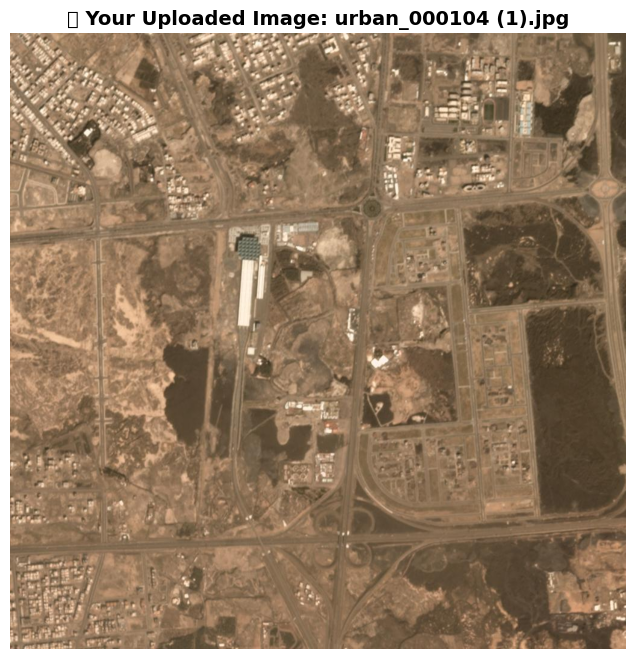


🔍 ANALYZING URBAN EXPANSION


/tmp/ipython-input-2877511550.py:124: UserWarning: Glyph 128247 (\N{CAMERA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2877511550.py:124: UserWarning: Glyph 127961 (\N{CITYSCAPE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2877511550.py:124: UserWarning: Glyph 127750 (\N{CITYSCAPE AT DUSK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2877511550.py:124: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


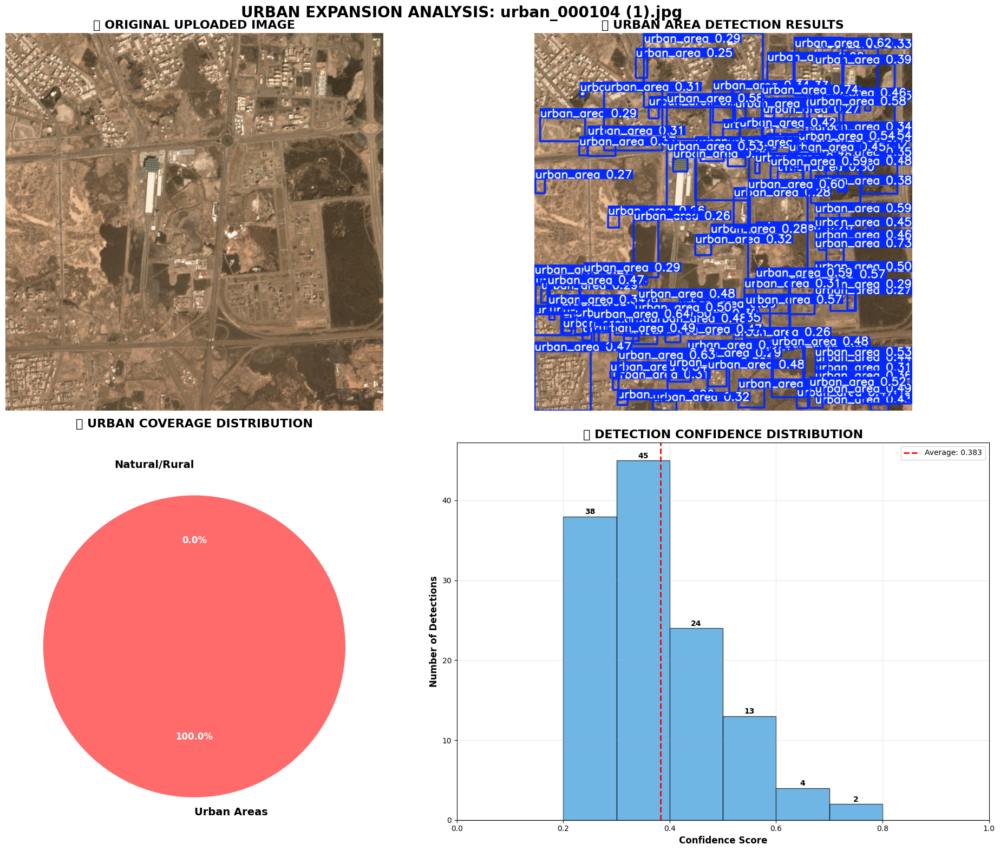


🌆 COMPREHENSIVE URBAN EXPANSION ANALYSIS REPORT
📊 DETECTION SUMMARY:
   ✅ Total Urban Areas Detected: 126
   🎯 Average Confidence: 0.383
   📈 Confidence Range: 0.250 - 0.744

📐 URBAN COVERAGE ANALYSIS:
   🏙️  Total Urban Coverage: 59389682.53%
   📏 Average Urban Area Size: 471346.69% of image

🏗️  URBAN EXPANSION ASSESSMENT:
   📍 LEVEL: 🔴 EXTREME URBAN EXPANSION
   📝 DESCRIPTION: Very high urban density with significant infrastructure development
   💡 RECOMMENDATION: Immediate environmental impact assessment and sustainable planning required

🔍 QUALITY ASSESSMENT:
   🔍 Lower-confidence detections (Avg confidence: 0.383)
📄 Analysis report saved: urban_analysis_report_urban_000104 (1).json


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'urban_area'}
 obb: None
 orig_img: array([[[ 86, 118, 153],
         [ 86, 118, 153],
         [ 91, 124, 157],
         ...,
         [ 53,  74,  89],
         [ 53,  74,  89],
         [ 53,  74,  89]],
 
        [[ 89, 121, 156],
         [ 89, 121, 156],
         [ 93, 126, 159],
         ...,
         [ 53,  74,  89],
         [ 53,  74,  89],
         [ 53,  74,  89]],
 
        [[ 92, 124, 159],
         [ 91, 123, 158],
         [ 95, 128, 161],
         ...,
         [ 53,  74,  89],
         [ 53,  74,  89],
         [ 53,  74,  89]],
 
        ...,
 
        [[ 70,  92, 128],
         [ 74,  96, 131],
         [ 82, 104, 139],
         ...,
         [103, 139, 185],
         [105, 141, 187],
         [106, 142, 188]],
 
        [[ 88, 107, 145],
         [ 98, 117, 154],
         [111, 131, 166],
         ...,
         [102,

In [ ]:
# COMPLETE UPLOAD TEST - RUN THIS CELL
def urban_expansion_upload_test():
    print("🚀 URBAN EXPANSION UPLOAD TEST")
    print("=" * 50)
    print("📤 Please select an image file from your computer...")
    print("💡 The upload dialog should appear below this message")
    print()

    try:
        # This will trigger the file upload
        from google.colab import files
        import io
        from PIL import Image

        uploaded = files.upload()

        if not uploaded:
            print("❌ No file selected. Please try again.")
            return

        for filename in uploaded.keys():
            print(f"✅ File selected: {filename}")
            print("🔄 Processing image...")

            # Process the image
            image = Image.open(io.BytesIO(uploaded[filename]))

            # Display the uploaded image
            plt.figure(figsize=(10, 8))
            plt.imshow(image)
            plt.title(f"📷 Your Uploaded Image: {filename}", fontsize=14, fontweight='bold')
            plt.axis('off')
            plt.show()

            # Save temporarily and analyze
            temp_path = f"uploaded_{filename}"
            image.save(temp_path)

            # Use the production predictor to analyze
            if 'production_predictor' in globals():
                results = production_predictor.comprehensive_analysis(temp_path, filename)

                # Clean up
                if os.path.exists(temp_path):
                    os.remove(temp_path)

                return results
            else:
                print("❌ Production predictor not available. Please run previous cells first.")
                return

    except Exception as e:
        print(f"❌ Upload error: {e}")
        print("💡 Make sure you run all previous cells first!")
        return

# RUN THIS TO TRIGGER UPLOAD
urban_expansion_upload_test()